In [13]:
import numpy as np
from astropy.io import fits
%matplotlib inline
from matplotlib import pyplot as plt
from astropy.visualization import hist
import ccdproc as ccdp
from matplotlib import rc
import os
import time

#from ccdproc import ImageFileCollection
#from astropy.modeling import fitting
#from astropy.stats import mad_std
from astropy.nddata import CCDData
#from scipy import stats
#from astropy import units as u
from astropy.stats import sigma_clip
from datetime import datetime

phot_tutorial_dir = '/Users/polinapetrov/F21/ASTR8060/phot_tutorial/notebooks'
plt.style.use(phot_tutorial_dir+'/guide.mplstyle')
rc('font', size=12)
rc('axes', grid=True)

import sys
sys.path.insert(0,phot_tutorial_dir)
from convenience_functions import show_image

In [14]:
data_dir = '/Users/polinapetrov/F21/ASTR8060/Imaging/'
reduced_dir = '/Users/polinapetrov/F21/ASTR8060/reduced_2/'

# Q1

*All frames have been overscan, trim, and bias corrected in the HW4-revisions notebook.*

# Q2

Examine your individual flat field images for the V filter. Are there significant artifacts? How might we combine the frames into a master flat field frame to get rid of these artifacts? Compare the average light levels in your V flats and say how this will impact your combine strategy (hint: you will want to scale your flat field images to a common level, and then combine using some weighting to account for the fact that some flats have higher signal than others–it world be inappropriate to give them all equal weight). After scaling to a common mean, discuss the advantages and disadvantages of making a master flat field image from:

- A straight average of all V flat frames
- A straight median of all V flat frames
- An average where outlier pixels are rejected if they are more than 3σ from the mean
- An average where outlier pixels are rejected and the weighted mean is obtained by weighting each image by the mean counts in the original image. This way, bright flats field exposures with higher count rates are given more weight than flats with low light levels

Which of these strategies, if any, is the best? Or is some combination the right approach? Show plots and metrics like RMS to defend your conclusions.

In [15]:
#opening V flats
imgs = ccdp.ImageFileCollection(reduced_dir,glob_include='*otz.fits')
V_flats = imgs.files_filtered(imagetyp='skyflat',filter='V',include_path=True)

INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


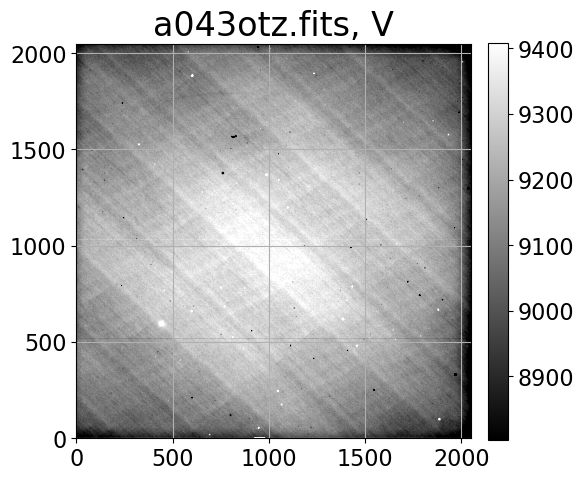

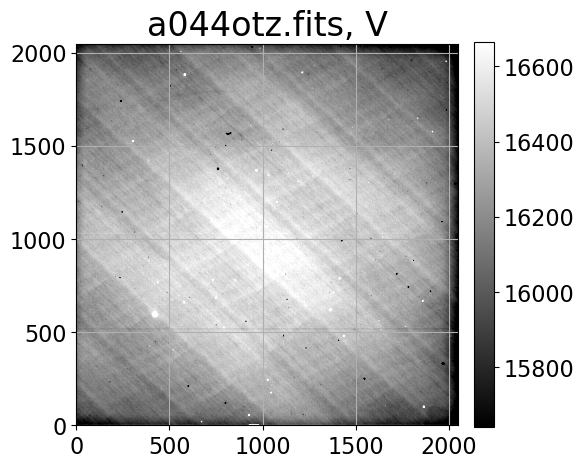

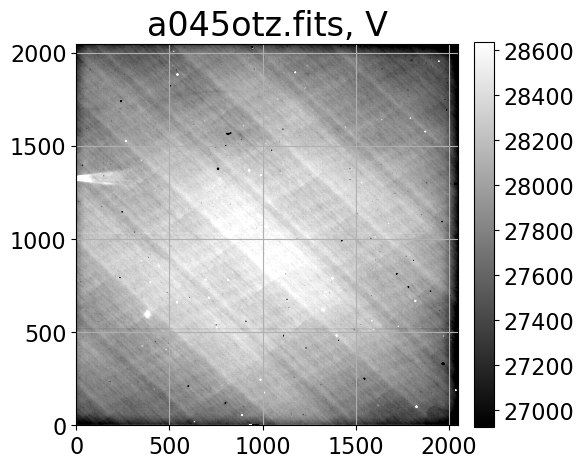

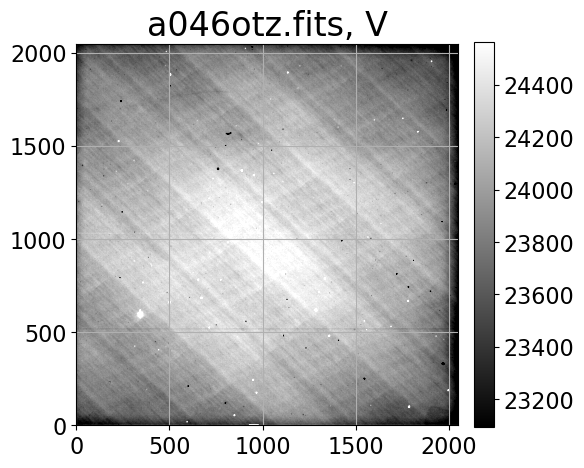

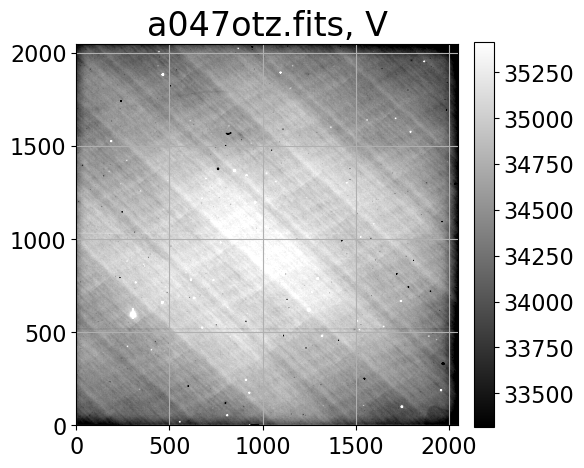

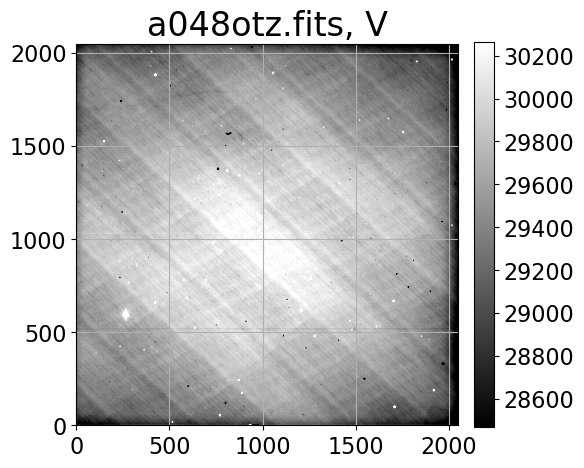

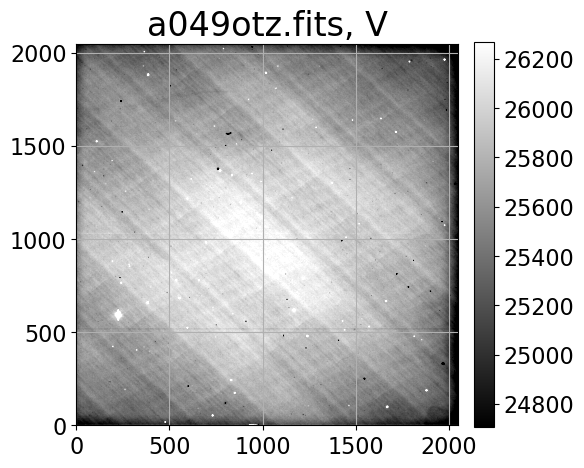

In [16]:
#examining individual flat field images for V filter
for i in range(0,len(V_flats)):
    flat = CCDData.read(V_flats[i],unit='adu')
    fig, ax = plt.subplots(1, 1, figsize=(6, 6))
    show_image(flat.data, cmap='gray', ax=ax, fig=fig)
    ax.set_title(V_flats[i][-12:]+', V')
    plt.tight_layout()

Yes, there are significant artifacts throughout the V-band flats. These frames can be combined into a master flat field frame to get rid of these artifacts using a few different methods. A straight average probably will not remove the artifacts, as they appear in multiple (if not all) frames, and consequently will appear in the master frame. A straight median may or may not remove them as it will just give you the middle-value frame. Doing an average or median with sigma clipping will help to remove some of these artifacts, as they are essentially outliers in the image. The individual pixels with these outlier artifacts will be thrown out and consequently not appear on the master frame.

INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.
INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]
INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.
INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]
INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


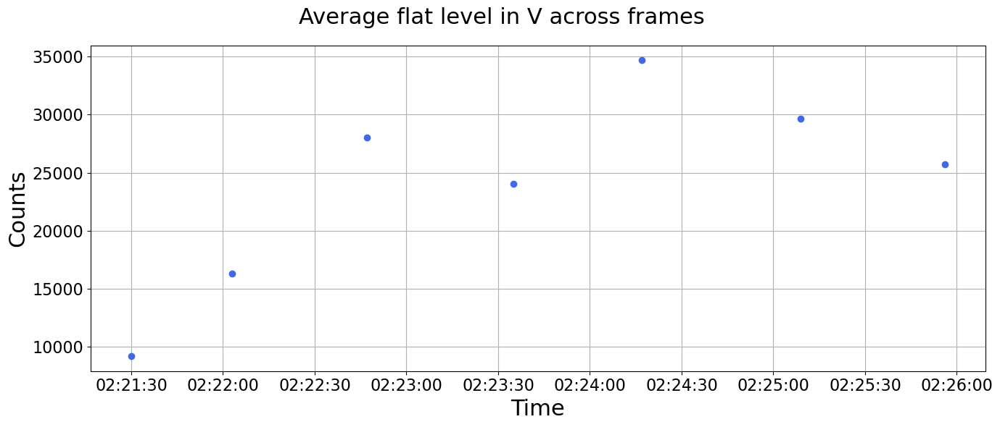

In [17]:
#Comparing the average light level in each V flat
V_files = [CCDData.read(file,unit='adu') for file in V_flats]
V_mns = [np.mean(V_file.data) for V_file in V_files]
times = imgs.filter(imagetyp='skyflat',filter='V').summary['date-obs'].data.data 
V_times = [datetime.strptime(time,'%Y-%m-%dT%H:%M:%S.%f') for time in times]

#plotting average light level as a function of time for V flats
#7 timestamps corresponding to the 7 flats
fig, ax = plt.subplots(figsize=(14,6))
ax.plot(V_times,V_mns,'royalblue',marker='o',ls='')
ax.set_xlabel(r'Time',fontsize=22)
ax.set_ylabel(r'Counts',fontsize=22)
fig.suptitle('Average flat level in V across frames',fontsize=22)
fig.tight_layout()

In [18]:
max(V_mns)-min(V_mns)

25486.502389683883

The average light level changes significantly as the V flats are taken, with the greatest difference being ~25487 counts. Consequently, doing only a straight mean or median combine (with or without sigma clipping) is not going to reduce the noise in the master frame. The V flats therefore need to be scaled to a common mean level and then combined using weighting, which will incorporate greater weights for flats that have higher signals as seen in the plot above.

In [19]:
#Scaling images to a common mean (for weighting version)
V_files = [CCDData.read(file,unit='adu').data for file in V_flats]
scale = np.mean(V_files,axis=(1,2))
scale_images = np.ones_like(V_files)*scale[:,np.newaxis,np.newaxis]
scaled_flats = V_files/scale_images

#Scaling function for ccdproc
def inv_mean(x):
    return 1./np.mean(x)

INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.
INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.
INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.
INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]
INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]
INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]
INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.
INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.
INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]
INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]
INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


In [20]:
#Making various master flats
V_mn_ccdp = ccdp.combine(V_flats,method='average',unit='adu',sigma_clip=False,scale=inv_mean) #straight average
V_med_ccdp = ccdp.combine(V_flats,method='median',unit='adu',sigma_clip=False,scale=inv_mean) #straight median
#V_mn_2sig_ccdp = ccdp.combine(V_flats,method='average',unit='adu',scale=inv_mean,sigma_clip=True,low_thresh=2,high_thresh=2) #average, sigma clip

#Average, sigma clip, and weighted mean
clipped = sigma_clip(scaled_flats, sigma=2, axis=0, masked=True) #sigma clipping scaled flats
w = np.array([np.ma.mean(i) for i in clipped*scale_images]) #calculating weights, ignoring clipped pixels
V_scw = np.ma.average(clipped,axis=0,weights=np.array(w)) #calculating weighted mean

#Clipped and scaled, no weights
V_sc = np.ma.average(clipped,axis=0)

INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.
INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.
INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]
INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]
INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.
INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.
INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.
INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]
INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]
INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]
INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.
INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.
INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]
INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]
INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.
INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]
INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.
INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]
INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.
INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.
INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.
INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]
INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]
INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]
INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.
INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.
INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.
INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]
INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]
INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]
INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.
INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.
INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]
INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]
INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.
INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]
INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.
INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]
INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


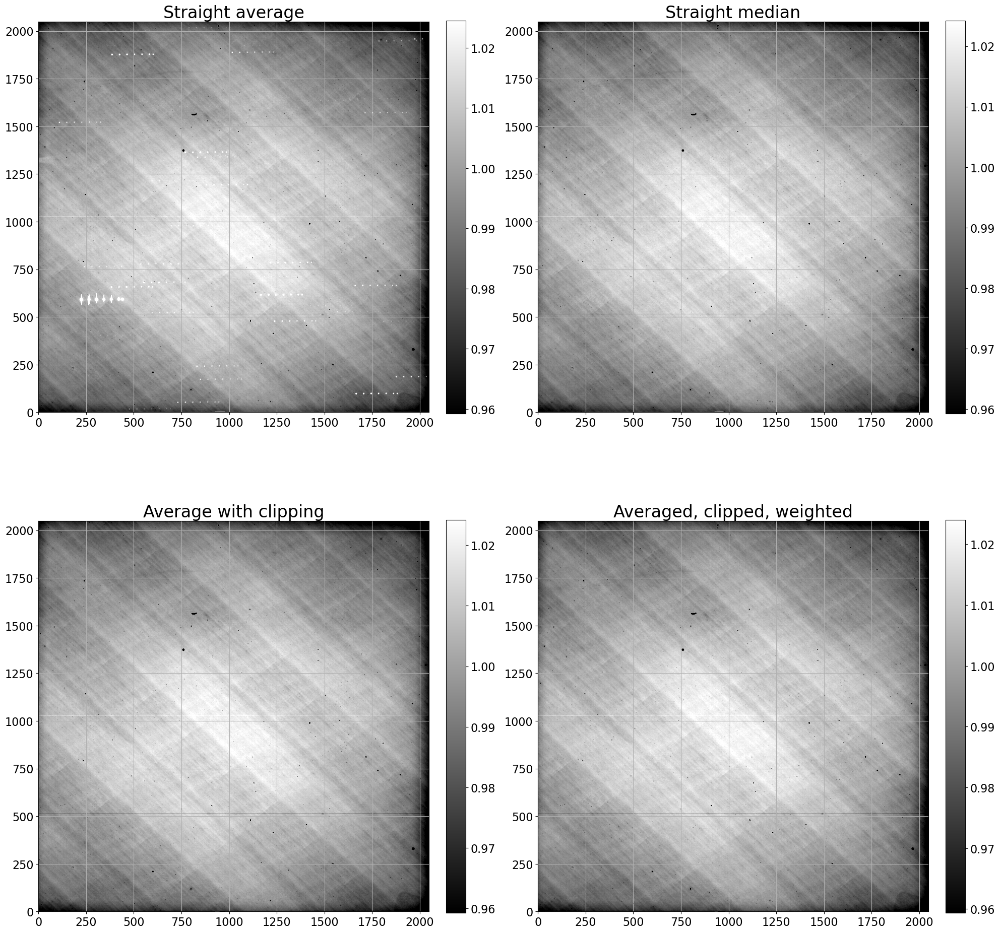

In [21]:
#Plot all four master flats
fig, (ax1,ax2) = plt.subplots(2, 2, figsize=(20, 20))
show_image(V_mn_ccdp.data, cmap='gray', ax=ax1[0], fig=fig)
ax1[0].set_title('Straight average')
show_image(V_med_ccdp.data, cmap='gray', ax=ax1[1], fig=fig)
ax1[1].set_title('Straight median')
show_image(V_sc, cmap='gray', ax=ax2[0], fig=fig)
ax2[0].set_title('Average with clipping')
show_image(V_scw, cmap='gray', ax=ax2[1], fig=fig)
ax2[1].set_title('Averaged, clipped, weighted')
plt.tight_layout()
plt.show()

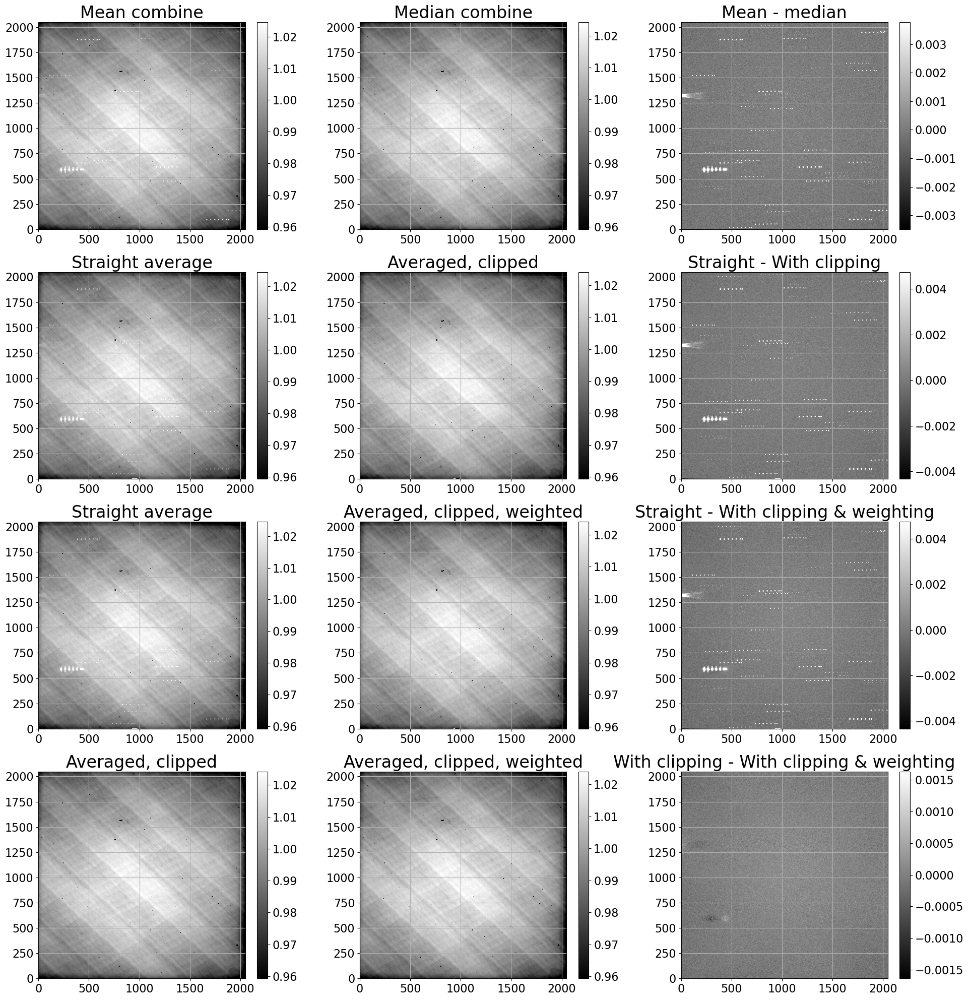

In [22]:
fig, (ax1,ax2,ax3,ax4) = plt.subplots(4, 3, figsize=(20, 20))

#Plotting difference between average and median
ax1[0].set_title('Mean combine')
show_image(V_mn_ccdp.data, cmap='gray', ax=ax1[0], fig=fig)
ax1[1].set_title('Median combine')
show_image(V_med_ccdp.data, cmap='gray', ax=ax1[1], fig=fig)
ax1[2].set_title('Mean - median')
show_image(V_mn_ccdp.data-V_med_ccdp.data, cmap='gray', ax=ax1[2], fig=fig)
#fig.suptitle('Difference betwen mean and median combine',size=28)

#Plotting difference between straight average and average with clipping
ax2[0].set_title('Straight average')
show_image(V_mn_ccdp.data, cmap='gray', ax=ax2[0], fig=fig)
ax2[1].set_title('Averaged, clipped')
show_image(V_sc, cmap='gray', ax=ax2[1], fig=fig)
ax2[2].set_title('Straight - With clipping')
show_image(V_mn_ccdp.data-V_sc, cmap='gray', ax=ax2[2], fig=fig)

#Plotting difference between straight average and average with clipping & weighting
ax3[0].set_title('Straight average')
show_image(V_mn_ccdp.data, cmap='gray', ax=ax3[0], fig=fig)
ax3[1].set_title('Averaged, clipped, weighted')
show_image(V_scw, cmap='gray', ax=ax3[1], fig=fig)
ax3[2].set_title('Straight - With clipping & weighting')
show_image(V_mn_ccdp.data-V_scw, cmap='gray', ax=ax3[2], fig=fig)

#Plotting difference between average with clipping and average with clipping & weighting
ax4[0].set_title('Averaged, clipped')
show_image(V_sc, cmap='gray', ax=ax4[0], fig=fig)
ax4[1].set_title('Averaged, clipped, weighted')
show_image(V_scw, cmap='gray', ax=ax4[1], fig=fig)
ax4[2].set_title('With clipping - With clipping & weighting')
show_image(V_sc-V_scw, cmap='gray', ax=ax4[2], fig=fig)

plt.tight_layout()
plt.show()

In [23]:
#calculating rms for each master flat
mn_rms = np.std(V_mn_ccdp)
med_rms = np.std(V_med_ccdp)
mn_2sig_rms = np.std(V_sc)
scw_rms = np.std(V_scw)

print('Straight average:',mn_rms)
print('Straight median:',med_rms)
print('Average with clipping:',mn_2sig_rms)
print('Averaged, clipped, weighted:',scw_rms)

Straight average: 0.015514750319349064
Straight median: 0.014560712987722702
Average with clipping: 0.014539692986458968
Averaged, clipped, weighted: 0.01447047490664162


Overall, doing a median combine is more robust against outliers as compared to a mean combine (and a median combine requires more than 2 frames). Sigma clipping aids in outlier rejection, and weighting does even better to remove any artifacts in the frame. The best strategy then is to use an average combine with scaling, sigma clipping, and weighting.

# Q3

Combine your flat field images to make a master flat for all filters using the strategy that you arrived at above.

In [56]:
#Using the averaged, scaled, clipped, and weighted version
#Already done for V flats, renaming to keep track
V_master = V_scw

imgs = ccdp.ImageFileCollection(reduced_dir,glob_include='*otz.fits')

#Repeating for U-band flats
U_flats = imgs.files_filtered(imagetyp='skyflat',filter='U',include_path=True)
U_files = [CCDData.read(file,unit='adu').data for file in U_flats]
U_scale = np.mean(U_files,axis=(1,2))
U_scale_images = np.ones_like(U_files)*U_scale[:,np.newaxis,np.newaxis]
U_scaled_flats = U_files/U_scale_images
U_clipped = sigma_clip(U_scaled_flats, sigma=2, axis=0, masked=True)
U_weights = np.array([np.ma.mean(i) for i in U_clipped*U_scale_images])
U_master = np.ma.average(U_clipped,axis=0,weights=np.array(U_weights))

#Repeating for B-band flats
B_flats = imgs.files_filtered(imagetyp='skyflat',filter='B',include_path=True)
B_files = [CCDData.read(file,unit='adu').data for file in B_flats]
B_scale = np.mean(B_files,axis=(1,2))
B_scale_images = np.ones_like(B_files)*B_scale[:,np.newaxis,np.newaxis]
B_scaled_flats = B_files/B_scale_images
B_clipped = sigma_clip(B_scaled_flats, sigma=2, axis=0, masked=True)
B_weights = np.array([np.ma.mean(i) for i in B_clipped*B_scale_images])
B_master = np.ma.average(B_clipped,axis=0,weights=np.array(B_weights))

#Repating for R-band flats
R_flats = imgs.files_filtered(imagetyp='skyflat',filter='R',include_path=True)
R_files = [CCDData.read(file,unit='adu').data for file in R_flats]
R_scale = np.mean(R_files,axis=(1,2))
R_scale_images = np.ones_like(R_files)*R_scale[:,np.newaxis,np.newaxis]
R_scaled_flats = R_files/R_scale_images
R_clipped = sigma_clip(R_scaled_flats, sigma=2, axis=0, masked=True)
R_weights = np.array([np.ma.mean(i) for i in R_clipped*R_scale_images])
R_master = np.ma.average(R_clipped,axis=0,weights=np.array(R_weights))

#Repating for I-band flats
I_flats = imgs.files_filtered(imagetyp='skyflat',filter='I',include_path=True)
I_files = [CCDData.read(file,unit='adu').data for file in I_flats]
I_scale = np.mean(I_files,axis=(1,2))
I_scale_images = np.ones_like(I_files)*I_scale[:,np.newaxis,np.newaxis]
I_scaled_flats = I_files/I_scale_images
I_clipped = sigma_clip(I_scaled_flats, sigma=2, axis=0, masked=True)
I_weights = np.array([np.ma.mean(i) for i in I_clipped*I_scale_images])
I_master = np.ma.average(I_clipped,axis=0,weights=np.array(I_weights))

#Repating for H-alpha flats
Ha_flats = imgs.files_filtered(imagetyp='skyflat',filter='Halpha',include_path=True)
Ha_files = [CCDData.read(file,unit='adu').data for file in Ha_flats]
Ha_scale = np.mean(Ha_files,axis=(1,2))
Ha_scale_images = np.ones_like(Ha_files)*Ha_scale[:,np.newaxis,np.newaxis]
Ha_scaled_flats = Ha_files/Ha_scale_images
Ha_clipped = sigma_clip(Ha_scaled_flats, sigma=2, axis=0, masked=True)
Ha_weights = np.array([np.ma.mean(i) for i in Ha_clipped*Ha_scale_images])
Ha_master = np.ma.average(Ha_clipped,axis=0,weights=np.array(Ha_weights))

INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.
INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]
INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.
INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]
INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.
INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]
INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


# Q4

Normalize your master flat field image for each filter so that it has a mean of 1 (i.e., find the mean in the image and divide by that mean). This way, when you divide your images by your master flat field image, you don’t lose track of your photon statistics.

In [57]:
master_flats = [U_master,B_master,V_master,R_master,I_master,Ha_master]
print(np.shape(master_flats))
master_means = np.mean(master_flats,axis=(1,2))
print(np.shape(master_means))

norm_master_flats = []
for i in range(0,len(master_flats)):
    norm_image = master_flats[i]/master_means[i]
    norm_master_flats.append(norm_image)

(6, 2048, 2048)
(6,)


# Q5

Divide your science frames by your normalized flat field.

In [92]:
#opening science frames: all good data for PG1633+099
nfiles = 12
nlow = 81
science_files = [reduced_dir+'a'+str(i).zfill(3)+'otz.fits' for i in np.arange(nfiles)+nlow]
hdus = [fits.open(file) for file in science_files]
hdrs = [hdu[0].header for hdu in hdus]
data = [hdu[0].data for hdu in hdus]

for i in range(np.size(hdus)):
    if i==0 or i==1:
        hdrs[i]['FILTER'] = 'U'
        hdus[i].writeto(science_files[i], overwrite=True)
        #ccd = data[i]/norm_master_flats[0] #dividing by U master flat
        #outfile = science_files[i].strip('otz.fits')+'otzf.fits'
        #(ccd.data).write(reduced_dir / outfile, overwrite=True) # saving the result
    if i==2 or i==3:
        hdrs[i]['FILTER'] = 'B'
        hdus[i].writeto(science_files[i], overwrite=True)
        #ccd = data[i]/norm_master_flats[1] #dividing by B master flat
        #outfile = science_files[i].strip('otz.fits')+'otzf.fits'
        #(ccd.data).write(reduced_dir / outfile, overwrite=True) # saving the result
    if i==4 or i==5:
        hdrs[i]['FILTER'] = 'V'
        hdus[i].writeto(science_files[i], overwrite=True)
        #ccd = data[i]/norm_master_flats[2] #dividing by V master flat
        #outfile = science_files[i].strip('otz.fits')+'otzf.fits'
        #(ccd.data).write(reduced_dir / outfile, overwrite=True) # saving the result
    if i==6 or i==7:
        hdrs[i]['FILTER'] = 'R'
        hdus[i].writeto(science_files[i], overwrite=True)
        #ccd = data[i]/norm_master_flats[3] #dividing by R master flat
        #outfile = science_files[i].strip('otz.fits')+'otzf.fits'
        #(ccd.data).write(reduced_dir / outfile, overwrite=True) # saving the result
    if i==8 or i==9:
        hdrs[i]['FILTER'] = 'I'
        hdus[i].writeto(science_files[i], overwrite=True)
        #ccd = data[i]/norm_master_flats[4] #dividing by I master flat
        #outfile = science_files[i].strip('otz.fits')+'otzf.fits'
        #(ccd.data).write(reduced_dir / outfile, overwrite=True) # saving the result
    if i==9 or i==10:
        hdrs[i]['FILTER'] = 'Halpha'
        hdus[i].writeto(science_files[i], overwrite=True)
        #ccd = data[i]/norm_master_flats[5] #dividing by Ha master flat
        #outfile = science_files[i].strip('otz.fits')+'otzf.fits'
        #(ccd.data).write(reduced_dir / outfile, overwrite=True) # saving the result

In [98]:
#dividing science frames by their respective filter flat
#e.g. first 2 science frames are in U-band, dividing by U master flat
#next 2 science frames are in B-band, dividing by B master flat, and so on

imgs = ccdp.ImageFileCollection(reduced_dir,filenames=['a081otz.fits','a082otz.fits','a083otz.fits','a084otz.fits','a085otz.fits','a086otz.fits','a087otz.fits','a088otz.fits','a089otz.fits','a090otz.fits','a091otz.fits','a092otz.fits'])
for ccd, file_name in imgs.ccds(ccd_kwargs={'unit': 'adu'},return_fname=True):
    if file_name == 'a081otz.fits' or file_name == 'a082otz.fits':
        ccd_flatfielded = ccd/(norm_master_flats[0].data) #dividing by U master flat
        outfile = file_name.strip('otz.fits')+'otzf.fits'
        ccd_flatfielded.write(reduced_dir / outfile, overwrite=True)
    if file_name == 'a083otz.fits' or file_name == 'a084otz.fits':
        ccd_flatfielded = ccd/norm_master_flats[1].data #dividing by B master flat
        outfile = file_name.strip('otz.fits')+'otzf.fits'
        ccd_flatfielded.write(reduced_dir / outfile, overwrite=True)
    if file_name == 'a085otz.fits' or file_name == 'a086otz.fits':
        ccd_flatfielded = ccd/norm_master_flats[2].data #dividing by V master flat
        outfile = file_name.strip('otz.fits')+'otzf.fits'
        ccd_flatfielded.write(reduced_dir / outfile, overwrite=True)
    if file_name == 'a087otz.fits' or file_name == 'a088otz.fits':
        ccd_flatfielded = ccd/norm_master_flats[3].data #dividing by R master flat
        outfile = file_name.strip('otz.fits')+'otzf.fits'
        ccd_flatfielded.write(reduced_dir / outfile, overwrite=True)
    if file_name == 'a089otz.fits' or file_name == 'a090otz.fits':
        ccd_flatfielded = ccd/norm_master_flats[4].data #dividing by I master flat
        outfile = file_name.strip('otz.fits')+'otzf.fits'
        ccd_flatfielded.write(reduced_dir / outfile, overwrite=True)
    if file_name == 'a091otz.fits' or file_name == 'a092otz.fits':
        ccd_flatfielded = ccd/norm_master_flats[5].data #dividing by Ha master flat
        outfile = file_name.strip('otz.fits')+'otzf.fits'
        ccd_flatfielded.write(reduced_dir / outfile, overwrite=True)

INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


AttributeError: 'MaskedArray' object has no attribute 'write'

Divided science frames by their respective master flats but having issues saving because of the masked array. Removing masked array by using .data then gives me the error: 'numpy.ndarray' object has no attribute 'write'. This all makes sense given that it's not in fits format, just don't have the time/energy to fix it right now so I'll return to it next time!

# Q6

Compute the gain and read noise for this CCD using a couple of the flat field images and bias images, as described in Howell’s Handbook of CCD Astronomy and in class notes. Decide, by examination, what sections of each image you should use to determine these values (using the whole frame is probably not a good idea, why?). NOTE: The flat-field images, F, that are used for this procedure should already be flat-fielded using a normalized master flat. Otherwise, the sigma term will contain contributions both from Poisson noise AND from pixel-to-pixel sensitivity fluctuations, and be too large, leading to an unrealistically small gain.

In [130]:
#opening two bias frames
bias1_hdu = fits.open(reduced_dir+'a094otz.fits')
bias1 = bias1_hdu[0].data
bias2_hdu = fits.open(reduced_dir+'a095otz.fits')
bias2 = bias2_hdu[0].data

#opening two V-band flats
#not already flat-fielded so I divide by normalized master V flat
V_flat1_notnorm_hdu = fits.open(reduced_dir+'a043otz.fits')
V_flat1_notnorm = V_flat1_notnorm_hdu[0].data
V_flat1 = V_flat1_notnorm / norm_master_flats[2]
V_flat2_notnorm_hdu = fits.open(reduced_dir+'a044otz.fits')
V_flat2_notnorm = V_flat2_notnorm_hdu[0].data
V_flat2 = V_flat2_notnorm / norm_master_flats[2]

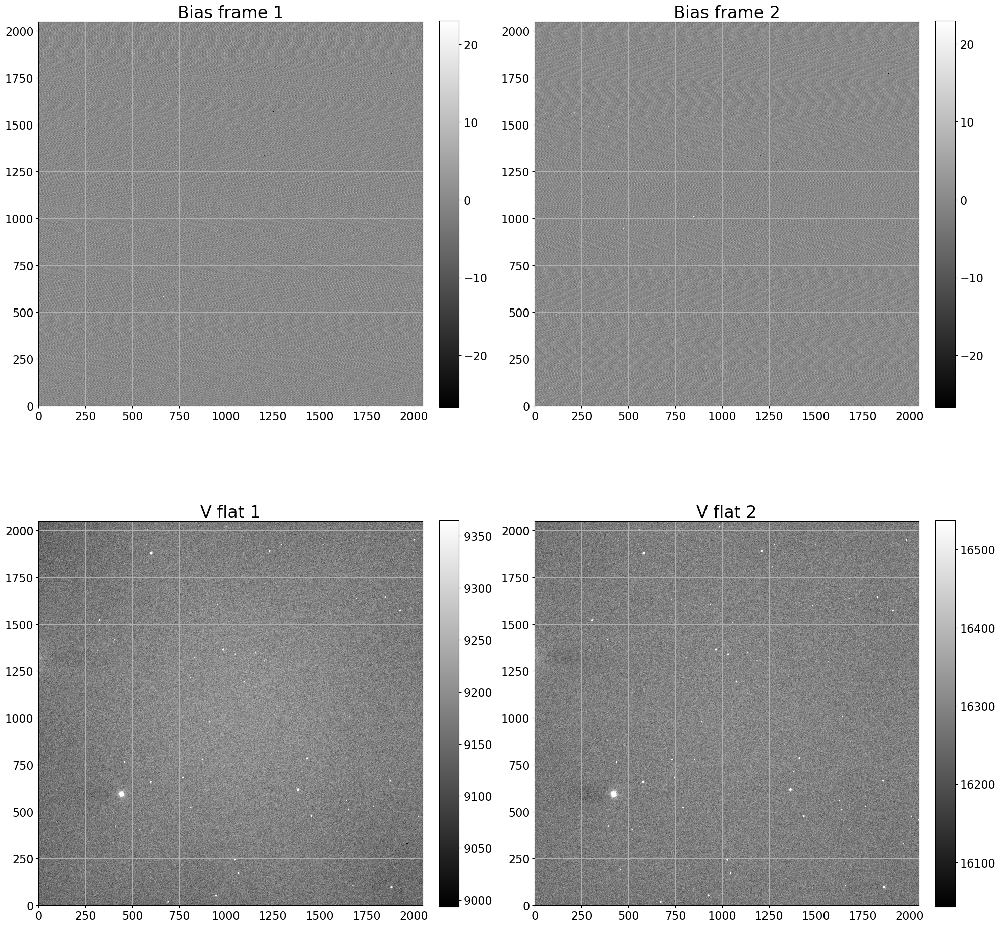

In [108]:
#plotting all four images
fig, (ax1,ax2) = plt.subplots(2, 2, figsize=(20, 20))
show_image(bias1, cmap='gray', ax=ax1[0], fig=fig)
ax1[0].set_title('Bias frame 1')
show_image(bias2, cmap='gray', ax=ax1[1], fig=fig)
ax1[1].set_title('Bias frame 2')
show_image(V_flat1, cmap='gray', ax=ax2[0], fig=fig)
ax2[0].set_title('V flat 1')
show_image(V_flat2, cmap='gray', ax=ax2[1], fig=fig)
ax2[1].set_title('V flat 2')
plt.tight_layout()
plt.show()

It's probably best to compute these values using some section around the middle of the frames as the edges of the frame are susceptible to CCD readout properties that might result in very large or very small values.

In [140]:
#selecting 50x50 section in the middle
bias1_sectioned = bias1[999:1049,999:1049]
bias2_sectioned = bias2[999:1049,999:1049]
V_flat1_sectioned = V_flat1.data[999:1049,999:1049] #removing masked array here and in next line with .data
V_flat2_sectioned = V_flat2.data[999:1049,999:1049]

#calculating mean pixel value in each image
B1_mn = np.mean(bias1_sectioned,axis=(0,1))
B2_mn = np.mean(bias2_sectioned,axis=(0,1))
Vf1_mn = np.mean(V_flat1_sectioned,axis=(0,1))
Vf2_mn = np.mean(V_flat2_sectioned,axis=(0,1))

#creating difference images
B1_B2 = bias1_sectioned - bias2_sectioned
F1_F2 = V_flat1_sectioned - V_flat2_sectioned
#finding std dev of difference images
B1_B2_stddev = np.std(B1_B2)
F1_F2_stddev = np.std(F1_F2)

#computing gain
gain = ((Vf1_mn+Vf2_mn)-(B1_mn+B2_mn))/((F1_F2_stddev**2)-(B1_B2_stddev**2))
#computing read noise
read_noise = (gain*B1_B2_stddev)/(np.sqrt(2))

print('Gain:',gain)
print('Read noise:',read_noise)

Gain: 1.5742647297465573
Read noise: 13.121957919271876
